In [2]:
import pandas as pd

In [2]:
# Source: http://web.mta.info/developers/turnstile.html
def get_data(week_nums):
    url = "http://web.mta.info/developers/data/nyct/turnstile/turnstile_{}.txt"
    dfs = []
    for week_num in week_nums:
        file_url = url.format(week_num)
        dfs.append(pd.read_csv(file_url))
    return pd.concat(dfs)
        
week_nums = [210731, 210724, 210717, 210710, 200725, 200718, 200711, 200704, 210828, 210904, 210911, 210918]
turnstiles_df = get_data(week_nums)

In [4]:
turnstiles_df.to_csv('C:/Users/New User/Documents/Github/NBM_EDA_Student/MTA.csv')

In [3]:
MTA_df = pd.read_csv('C:/Users/New User/Documents/Github/NBM_EDA_Student/MTA.csv')

In [4]:
MTA_df.head()

,Unnamed: 0,C/A,UNIT,SCP,STATION,LINENAME,DIVISION,DATE,TIME,DESC,ENTRIES,EXITS
0,0,A002,R051,02-00-00,59 ST,NQR456W,BMT,07/24/2021,00:00:00,REGULAR,7607483,2601554
1,1,A002,R051,02-00-00,59 ST,NQR456W,BMT,07/24/2021,04:00:00,REGULAR,7607496,2601563
2,2,A002,R051,02-00-00,59 ST,NQR456W,BMT,07/24/2021,08:00:00,REGULAR,7607510,2601576
3,3,A002,R051,02-00-00,59 ST,NQR456W,BMT,07/24/2021,12:00:00,REGULAR,7607548,2601619
4,4,A002,R051,02-00-00,59 ST,NQR456W,BMT,07/24/2021,16:00:00,REGULAR,7607668,2601661


In [5]:
MTA_df.columns

Index(['Unnamed: 0', 'C/A', 'UNIT', 'SCP', 'STATION', 'LINENAME', 'DIVISION',
       'DATE', 'TIME', 'DESC', 'ENTRIES',
       'EXITS                                                               '],
      dtype='object')

In [6]:
MTA_df = MTA_df.drop('Unnamed: 0', axis=1)

In [7]:
MTA_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2504501 entries, 0 to 2504500
Data columns (total 11 columns):
 #   Column                                                                Dtype 
---  ------                                                                ----- 
 0   C/A                                                                   object
 1   UNIT                                                                  object
 2   SCP                                                                   object
 3   STATION                                                               object
 4   LINENAME                                                              object
 5   DIVISION                                                              object
 6   DATE                                                                  object
 7   TIME                                                                  object
 8   DESC                                                          

In [8]:
MTA_df.describe()

,ENTRIES,EXITS
count,2.504501e+06,2.504501e+06
mean,4.190185e+07,3.375539e+07
std,2.179969e+08,1.937140e+08
min,0.000000e+00,0.000000e+00
25%,2.462440e+05,1.108150e+05
50%,1.531473e+06,9.251100e+05
75%,6.199072e+06,4.113000e+06
max,2.147405e+09,2.133797e+09


In [9]:
MTA_df.head()

,C/A,UNIT,SCP,STATION,LINENAME,DIVISION,DATE,TIME,DESC,ENTRIES,EXITS
0,A002,R051,02-00-00,59 ST,NQR456W,BMT,07/24/2021,00:00:00,REGULAR,7607483,2601554
1,A002,R051,02-00-00,59 ST,NQR456W,BMT,07/24/2021,04:00:00,REGULAR,7607496,2601563
2,A002,R051,02-00-00,59 ST,NQR456W,BMT,07/24/2021,08:00:00,REGULAR,7607510,2601576
3,A002,R051,02-00-00,59 ST,NQR456W,BMT,07/24/2021,12:00:00,REGULAR,7607548,2601619
4,A002,R051,02-00-00,59 ST,NQR456W,BMT,07/24/2021,16:00:00,REGULAR,7607668,2601661


In [10]:
MTA_df.columns

Index(['C/A', 'UNIT', 'SCP', 'STATION', 'LINENAME', 'DIVISION', 'DATE', 'TIME',
       'DESC', 'ENTRIES',
       'EXITS                                                               '],
      dtype='object')

In [11]:
MTA_df.columns = [column.strip() for column in MTA_df.columns]
MTA_df.columns

Index(['C/A', 'UNIT', 'SCP', 'STATION', 'LINENAME', 'DIVISION', 'DATE', 'TIME',
       'DESC', 'ENTRIES', 'EXITS'],
      dtype='object')

In [12]:
MTA_df.DATE.value_counts().sort_index()

06/27/2020    29436
06/28/2020    29497
06/29/2020    30048
06/30/2020    29498
07/01/2020    30007
              ...  
09/13/2021    30103
09/14/2021    30292
09/15/2021    29833
09/16/2021    29928
09/17/2021    29884
Name: DATE, Length: 84, dtype: int64

In [13]:
import datetime
# from datetime import datetime as dt

In [14]:
# Take the date and time fields into a single datetime column
MTA_df["DATE_TIME"] = pd.to_datetime(MTA_df.DATE + " " + MTA_df.TIME, format="%m/%d/%Y %H:%M:%S")

In [15]:
MTA_df.head()

,C/A,UNIT,SCP,STATION,LINENAME,DIVISION,DATE,TIME,DESC,ENTRIES,EXITS,DATE_TIME
0,A002,R051,02-00-00,59 ST,NQR456W,BMT,07/24/2021,00:00:00,REGULAR,7607483,2601554,2021-07-24 00:00:00
1,A002,R051,02-00-00,59 ST,NQR456W,BMT,07/24/2021,04:00:00,REGULAR,7607496,2601563,2021-07-24 04:00:00
2,A002,R051,02-00-00,59 ST,NQR456W,BMT,07/24/2021,08:00:00,REGULAR,7607510,2601576,2021-07-24 08:00:00
3,A002,R051,02-00-00,59 ST,NQR456W,BMT,07/24/2021,12:00:00,REGULAR,7607548,2601619,2021-07-24 12:00:00
4,A002,R051,02-00-00,59 ST,NQR456W,BMT,07/24/2021,16:00:00,REGULAR,7607668,2601661,2021-07-24 16:00:00


In [16]:
mask = ((MTA_df["C/A"] == "A002") &
        (MTA_df["UNIT"] == "R051") & 
        (MTA_df["SCP"] == "02-00-00") & 
        (MTA_df["STATION"] == "59 ST"))

MTA_df[mask].head()

,C/A,UNIT,SCP,STATION,LINENAME,DIVISION,DATE,TIME,DESC,ENTRIES,EXITS,DATE_TIME
0,A002,R051,02-00-00,59 ST,NQR456W,BMT,07/24/2021,00:00:00,REGULAR,7607483,2601554,2021-07-24 00:00:00
1,A002,R051,02-00-00,59 ST,NQR456W,BMT,07/24/2021,04:00:00,REGULAR,7607496,2601563,2021-07-24 04:00:00
2,A002,R051,02-00-00,59 ST,NQR456W,BMT,07/24/2021,08:00:00,REGULAR,7607510,2601576,2021-07-24 08:00:00
3,A002,R051,02-00-00,59 ST,NQR456W,BMT,07/24/2021,12:00:00,REGULAR,7607548,2601619,2021-07-24 12:00:00
4,A002,R051,02-00-00,59 ST,NQR456W,BMT,07/24/2021,16:00:00,REGULAR,7607668,2601661,2021-07-24 16:00:00


In [17]:
mask = ((MTA_df["C/A"] == "R626") & 
(MTA_df["UNIT"] == "R062") & 
(MTA_df["SCP"] == "00-00-00") & 
(MTA_df["STATION"] == "CROWN HTS-UTICA"))

MTA_df[mask].head()

,C/A,UNIT,SCP,STATION,LINENAME,DIVISION,DATE,TIME,DESC,ENTRIES,EXITS,DATE_TIME
202616,R626,R062,00-00-00,CROWN HTS-UTICA,34,IRT,07/24/2021,00:00:00,REGULAR,15999879,3537785,2021-07-24 00:00:00
202617,R626,R062,00-00-00,CROWN HTS-UTICA,34,IRT,07/24/2021,04:00:00,REGULAR,15999884,3537799,2021-07-24 04:00:00
202618,R626,R062,00-00-00,CROWN HTS-UTICA,34,IRT,07/24/2021,08:00:00,REGULAR,16000035,3537813,2021-07-24 08:00:00
202619,R626,R062,00-00-00,CROWN HTS-UTICA,34,IRT,07/24/2021,12:00:00,REGULAR,16000198,3537842,2021-07-24 12:00:00
202620,R626,R062,00-00-00,CROWN HTS-UTICA,34,IRT,07/24/2021,16:00:00,REGULAR,16000391,3537881,2021-07-24 16:00:00


In [18]:
# Sanity Check to verify that "C/A", "UNIT", "SCP", "STATION", "DATE_TIME" is unique
(MTA_df
 .groupby(["C/A", "UNIT", "SCP", "STATION", "DATE_TIME"])
 .ENTRIES.count()
 .reset_index()
 .sort_values("ENTRIES", ascending=False)).head(5)

,C/A,UNIT,SCP,STATION,DATE_TIME,ENTRIES
2484582,S101,R070,00-00-02,ST. GEORGE,2021-09-10 08:00:00,2
2484538,S101,R070,00-00-02,ST. GEORGE,2021-09-03 00:00:00,2
2484526,S101,R070,00-00-02,ST. GEORGE,2021-09-01 00:00:00,2
2484528,S101,R070,00-00-02,ST. GEORGE,2021-09-01 08:00:00,2
2484530,S101,R070,00-00-02,ST. GEORGE,2021-09-01 16:00:00,2


In [19]:
# On 9/16, we seem to have two entries for same time.  Let's take a look
mask = ((MTA_df["C/A"] == "S101") & 
(MTA_df["UNIT"] == "R070") & 
(MTA_df["SCP"] == "00-00-02") & 
(MTA_df["STATION"] == "ST. GEORGE") &
(MTA_df["DATE_TIME"].dt.date == datetime.datetime(2021, 9, 10).date()))

MTA_df[mask].head()

,C/A,UNIT,SCP,STATION,LINENAME,DIVISION,DATE,TIME,DESC,ENTRIES,EXITS,DATE_TIME
2292933,S101,R070,00-00-02,ST. GEORGE,1,SRT,09/10/2021,00:00:00,REGULAR,1214191,140,2021-09-10 00:00:00
2292934,S101,R070,00-00-02,ST. GEORGE,1,SRT,09/10/2021,00:00:00,RECOVR AUD,1397266,324,2021-09-10 00:00:00
2292935,S101,R070,00-00-02,ST. GEORGE,1,SRT,09/10/2021,04:00:00,REGULAR,1214191,140,2021-09-10 04:00:00
2292936,S101,R070,00-00-02,ST. GEORGE,1,SRT,09/10/2021,08:00:00,REGULAR,1214252,140,2021-09-10 08:00:00
2292937,S101,R070,00-00-02,ST. GEORGE,1,SRT,09/10/2021,08:00:00,RECOVR AUD,1397331,324,2021-09-10 08:00:00


In [20]:
MTA_df.DESC.value_counts()

REGULAR       2491817
RECOVR AUD      12684
Name: DESC, dtype: int64

In [21]:
# Get rid of the duplicate entry
MTA_df.sort_values(["C/A", "UNIT", "SCP", "STATION", "DATE_TIME"], 
                          inplace=True, ascending=False)
MTA_df.drop_duplicates(subset=["C/A", "UNIT", "SCP", "STATION", "DATE_TIME"], inplace=True)

In [22]:
# Sanity Check to verify that "C/A", "UNIT", "SCP", "STATION", "DATE_TIME" is unique
(MTA_df
 .groupby(["C/A", "UNIT", "SCP", "STATION", "DATE_TIME"])
 .ENTRIES.count()
 .reset_index()
 .sort_values("ENTRIES", ascending=False)).head(5)

,C/A,UNIT,SCP,STATION,DATE_TIME,ENTRIES
0,A002,R051,02-00-00,59 ST,2020-06-27 00:00:00,1
1669599,R139,R031,04-00-00,34 ST-PENN STA,2021-09-01 20:00:00,1
1669592,R139,R031,04-00-00,34 ST-PENN STA,2021-08-31 16:00:00,1
1669593,R139,R031,04-00-00,34 ST-PENN STA,2021-08-31 20:00:00,1
1669594,R139,R031,04-00-00,34 ST-PENN STA,2021-09-01 00:00:00,1


In [23]:
MTA_df = MTA_df.drop(["EXITS", "DESC"], axis=1, errors="ignore")

In [24]:
MTA_df.columns

Index(['C/A', 'UNIT', 'SCP', 'STATION', 'LINENAME', 'DIVISION', 'DATE', 'TIME',
       'ENTRIES', 'DATE_TIME'],
      dtype='object')

In [25]:
MTA_df.DATE

2504500    09/17/2021
2504499    09/17/2021
2504498    09/17/2021
2504497    09/17/2021
2504496    09/17/2021
              ...    
1457441    06/27/2020
1457440    06/27/2020
1457439    06/27/2020
1457438    06/27/2020
1457437    06/27/2020
Name: DATE, Length: 2504395, dtype: object

In [26]:
MTA_df[(MTA_df["C/A"] == "A011") & 
(MTA_df["UNIT"] == "R080") & 
(MTA_df["SCP"] == "01-00-00") & 
(MTA_df["STATION"] == "57 ST-7 AV") &
(MTA_df["DATE"] == "09/17/2021")]

,C/A,UNIT,SCP,STATION,LINENAME,DIVISION,DATE,TIME,ENTRIES,DATE_TIME
2296070,A011,R080,01-00-00,57 ST-7 AV,NQRW,BMT,09/17/2021,20:00:00,509949,2021-09-17 20:00:00
2296069,A011,R080,01-00-00,57 ST-7 AV,NQRW,BMT,09/17/2021,16:00:00,509867,2021-09-17 16:00:00
2296068,A011,R080,01-00-00,57 ST-7 AV,NQRW,BMT,09/17/2021,12:00:00,509807,2021-09-17 12:00:00
2296067,A011,R080,01-00-00,57 ST-7 AV,NQRW,BMT,09/17/2021,08:00:00,509765,2021-09-17 08:00:00
2296066,A011,R080,01-00-00,57 ST-7 AV,NQRW,BMT,09/17/2021,04:00:00,509761,2021-09-17 04:00:00
2296065,A011,R080,01-00-00,57 ST-7 AV,NQRW,BMT,09/17/2021,00:00:00,509755,2021-09-17 00:00:00


In [27]:
turnstiles_daily = (MTA_df
                        .groupby(["C/A", "UNIT", "SCP", "STATION", "DATE"],as_index=False)
                        .ENTRIES.first())

In [28]:
turnstiles_daily.head()

,C/A,UNIT,SCP,STATION,DATE,ENTRIES
0,A002,R051,02-00-00,59 ST,06/27/2020,7426658
1,A002,R051,02-00-00,59 ST,06/28/2020,7426850
2,A002,R051,02-00-00,59 ST,06/29/2020,7427056
3,A002,R051,02-00-00,59 ST,06/30/2020,7427478
4,A002,R051,02-00-00,59 ST,07/01/2020,7427899


In [29]:
import datetime

In [30]:
# turnstiles_daily[["PREV_DATE", "PREV_ENTRIES"]] = (turnstiles_daily
#                                                        .groupby(["C/A", "UNIT", "SCP", "STATION"])[["DATE", "ENTRIES"]]
#                                                        .apply(lambda grp: grp.shift(1)))

turnstiles_daily[["PREV_DATE", "PREV_ENTRIES"]] = (turnstiles_daily
                                                       .groupby(["C/A", "UNIT", "SCP", "STATION"])[["DATE", "ENTRIES"]]
                                                       .shift(1))

In [31]:
turnstiles_daily.head()

,C/A,UNIT,SCP,STATION,DATE,ENTRIES,PREV_DATE,PREV_ENTRIES
0,A002,R051,02-00-00,59 ST,06/27/2020,7426658,NaN,NaN
1,A002,R051,02-00-00,59 ST,06/28/2020,7426850,06/27/2020,7426658.0
2,A002,R051,02-00-00,59 ST,06/29/2020,7427056,06/28/2020,7426850.0
3,A002,R051,02-00-00,59 ST,06/30/2020,7427478,06/29/2020,7427056.0
4,A002,R051,02-00-00,59 ST,07/01/2020,7427899,06/30/2020,7427478.0


In [32]:
turnstiles_daily.tail()

,C/A,UNIT,SCP,STATION,DATE,ENTRIES,PREV_DATE,PREV_ENTRIES
417470,TRAM2,R469,00-05-01,RIT-ROOSEVELT,09/13/2021,5554,09/12/2021,5554.0
417471,TRAM2,R469,00-05-01,RIT-ROOSEVELT,09/14/2021,5554,09/13/2021,5554.0
417472,TRAM2,R469,00-05-01,RIT-ROOSEVELT,09/15/2021,5554,09/14/2021,5554.0
417473,TRAM2,R469,00-05-01,RIT-ROOSEVELT,09/16/2021,5554,09/15/2021,5554.0
417474,TRAM2,R469,00-05-01,RIT-ROOSEVELT,09/17/2021,5554,09/16/2021,5554.0


In [33]:
# Drop the rows for the earliest date in the df
turnstiles_daily.dropna(subset=["PREV_DATE"], axis=0, inplace=True)

In [34]:
(turnstiles_daily["ENTRIES"] - turnstiles_daily["PREV_ENTRIES"]).describe()

count    4.124140e+05
mean    -1.914168e+04
std      5.813776e+07
min     -2.139073e+09
25%      0.000000e+00
50%      2.190000e+02
75%      1.474000e+03
max      2.139073e+09
dtype: float64

In [35]:
# How many rows are backwards
turnstiles_daily[turnstiles_daily["ENTRIES"] < turnstiles_daily["PREV_ENTRIES"]].shape

(100745, 8)

In [36]:
turnstiles_daily[turnstiles_daily["ENTRIES"] < turnstiles_daily["PREV_ENTRIES"]].head()

,C/A,UNIT,SCP,STATION,DATE,ENTRIES,PREV_DATE,PREV_ENTRIES
8,A002,R051,02-00-00,59 ST,07/04/2020,7428839,07/03/2021,7596715.0
10,A002,R051,02-00-00,59 ST,07/05/2020,7429011,07/04/2021,7597078.0
12,A002,R051,02-00-00,59 ST,07/06/2020,7429381,07/05/2021,7597477.0
14,A002,R051,02-00-00,59 ST,07/07/2020,7429787,07/06/2021,7598081.0
16,A002,R051,02-00-00,59 ST,07/08/2020,7430208,07/07/2021,7598741.0


In [37]:
# What's the deal with counter being in reverse
mask = ((MTA_df["C/A"] == "A011") & 
(MTA_df["UNIT"] == "R080") & 
(MTA_df["SCP"] == "01-00-00") & 
(MTA_df["STATION"] == "57 ST-7 AV") &
(MTA_df["DATE_TIME"].dt.date == datetime.date(2021, 7, 3)))

In [38]:
# It's actually a good idea to plot this, if you could
MTA_df[mask].sort_values('DATE_TIME')[['DATE', 'TIME', 'ENTRIES']]

,DATE,TIME,ENTRIES
629589,07/03/2021,00:00:00,496357
629590,07/03/2021,04:00:00,496362
629591,07/03/2021,08:00:00,496363
629592,07/03/2021,12:00:00,496384
629593,07/03/2021,16:00:00,496417
629594,07/03/2021,20:00:00,496454


In [39]:
# Let's see how many stations have this problem
(turnstiles_daily[turnstiles_daily["ENTRIES"] < turnstiles_daily["PREV_ENTRIES"]]
    .groupby(["C/A", "UNIT", "SCP", "STATION"])
    .size())

C/A    UNIT  SCP       STATION      
A002   R051  02-00-00  59 ST            21
             02-00-01  59 ST            21
             02-03-00  59 ST            21
             02-03-01  59 ST            21
             02-03-02  59 ST            22
                                        ..
TRAM2  R469  00-00-00  RIT-ROOSEVELT    21
             00-00-01  RIT-ROOSEVELT    21
             00-03-00  RIT-ROOSEVELT    21
             00-03-01  RIT-ROOSEVELT    21
             00-05-00  RIT-ROOSEVELT    22
Length: 4723, dtype: int64

In [40]:
def get_daily_counts(row, max_counter):
    '''
    Initial attempt at dealing with reversed counters
    '''
    
    counter = row["ENTRIES"] - row["PREV_ENTRIES"]
    
    if counter < 0:
        counter = -counter  # adjust for "reverse" counter
        
    if counter > max_counter:
        # If counter (daily count) is > 1M, then the counter might have been reset.  
        # Set count to zero as different counters have different cycle limits
        print(f'entries: {row["ENTRIES"]} <-- {row["PREV_ENTRIES"]}')

        return 0
    
    return counter


_ = turnstiles_daily.apply(get_daily_counts, axis=1, max_counter=3100)

entries: 7596715 <-- 7428640.0
entries: 7428839 <-- 7596715.0
entries: 7597078 <-- 7428839.0
entries: 7429011 <-- 7597078.0
entries: 7597477 <-- 7429011.0
entries: 7429381 <-- 7597477.0
entries: 7598081 <-- 7429381.0
entries: 7429787 <-- 7598081.0
entries: 7598741 <-- 7429787.0
entries: 7430208 <-- 7598741.0
entries: 7599341 <-- 7430208.0
entries: 7430592 <-- 7599341.0
entries: 7599931 <-- 7430592.0
entries: 7430967 <-- 7599931.0
entries: 7600274 <-- 7430967.0
entries: 7431232 <-- 7600274.0
entries: 7600582 <-- 7431232.0
entries: 7431417 <-- 7600582.0
entries: 7601119 <-- 7431417.0
entries: 7431833 <-- 7601119.0
entries: 7601765 <-- 7431833.0
entries: 7432283 <-- 7601765.0
entries: 7602356 <-- 7432283.0
entries: 7432751 <-- 7602356.0
entries: 7603018 <-- 7432751.0
entries: 7433211 <-- 7603018.0
entries: 7603647 <-- 7433211.0
entries: 7433679 <-- 7603647.0
entries: 7604034 <-- 7433679.0
entries: 7433965 <-- 7604034.0
entries: 7604372 <-- 7433965.0
entries: 7434164 <-- 7604372.0
entries:

In [41]:
def get_daily_counts(row, max_counter):
    counter = row["ENTRIES"] - row["PREV_ENTRIES"]
    
    if counter < 0:
        counter = -counter  # adjust for "reverse" counter
        
    if counter > max_counter:
        # Maybe counter was reset, so it may make sense to take the minimum
        print(f'entries: {row["ENTRIES"]} <-- {row["PREV_ENTRIES"]}')
        counter = min(row["ENTRIES"], row["PREV_ENTRIES"])
        
    if counter > max_counter:
        # If we still get a counter that is too big, set to zero
        return 0
    
    return counter

turnstiles_daily["DAILY_ENTRIES"] = turnstiles_daily.apply(get_daily_counts, axis=1, max_counter=3100)

entries: 7596715 <-- 7428640.0
entries: 7428839 <-- 7596715.0
entries: 7597078 <-- 7428839.0
entries: 7429011 <-- 7597078.0
entries: 7597477 <-- 7429011.0
entries: 7429381 <-- 7597477.0
entries: 7598081 <-- 7429381.0
entries: 7429787 <-- 7598081.0
entries: 7598741 <-- 7429787.0
entries: 7430208 <-- 7598741.0
entries: 7599341 <-- 7430208.0
entries: 7430592 <-- 7599341.0
entries: 7599931 <-- 7430592.0
entries: 7430967 <-- 7599931.0
entries: 7600274 <-- 7430967.0
entries: 7431232 <-- 7600274.0
entries: 7600582 <-- 7431232.0
entries: 7431417 <-- 7600582.0
entries: 7601119 <-- 7431417.0
entries: 7431833 <-- 7601119.0
entries: 7601765 <-- 7431833.0
entries: 7432283 <-- 7601765.0
entries: 7602356 <-- 7432283.0
entries: 7432751 <-- 7602356.0
entries: 7603018 <-- 7432751.0
entries: 7433211 <-- 7603018.0
entries: 7603647 <-- 7433211.0
entries: 7433679 <-- 7603647.0
entries: 7604034 <-- 7433679.0
entries: 7433965 <-- 7604034.0
entries: 7604372 <-- 7433965.0
entries: 7434164 <-- 7604372.0
entries:

In [42]:
turnstiles_daily.head()

,C/A,UNIT,SCP,STATION,DATE,ENTRIES,PREV_DATE,PREV_ENTRIES,DAILY_ENTRIES
1,A002,R051,02-00-00,59 ST,06/28/2020,7426850,06/27/2020,7426658.0,192.0
2,A002,R051,02-00-00,59 ST,06/29/2020,7427056,06/28/2020,7426850.0,206.0
3,A002,R051,02-00-00,59 ST,06/30/2020,7427478,06/29/2020,7427056.0,422.0
4,A002,R051,02-00-00,59 ST,07/01/2020,7427899,06/30/2020,7427478.0,421.0
5,A002,R051,02-00-00,59 ST,07/02/2020,7428311,07/01/2020,7427899.0,412.0


In [44]:
turnstiles_daily.tail()

,C/A,UNIT,SCP,STATION,DATE,ENTRIES,PREV_DATE,PREV_ENTRIES,DAILY_ENTRIES
417470,TRAM2,R469,00-05-01,RIT-ROOSEVELT,09/13/2021,5554,09/12/2021,5554.0,0.0
417471,TRAM2,R469,00-05-01,RIT-ROOSEVELT,09/14/2021,5554,09/13/2021,5554.0,0.0
417472,TRAM2,R469,00-05-01,RIT-ROOSEVELT,09/15/2021,5554,09/14/2021,5554.0,0.0
417473,TRAM2,R469,00-05-01,RIT-ROOSEVELT,09/16/2021,5554,09/15/2021,5554.0,0.0
417474,TRAM2,R469,00-05-01,RIT-ROOSEVELT,09/17/2021,5554,09/16/2021,5554.0,0.0


In [45]:
turnstiles_daily.DAILY_ENTRIES.describe()

count    412414.000000
mean        204.203141
std         389.667588
min           0.000000
25%           0.000000
50%           0.000000
75%         268.000000
max        3100.000000
Name: DAILY_ENTRIES, dtype: float64

In [47]:
turnstiles_daily.DAILY_ENTRIES.quantile(.95)

935.0

In [46]:
ca_unit_station_daily = turnstiles_daily.groupby(["C/A", "UNIT", "STATION", "DATE"])[['DAILY_ENTRIES']].sum().reset_index()
ca_unit_station_daily.head()

,C/A,UNIT,STATION,DATE,DAILY_ENTRIES
0,A002,R051,59 ST,06/28/2020,1280.0
1,A002,R051,59 ST,06/29/2020,2929.0
2,A002,R051,59 ST,06/30/2020,2985.0
3,A002,R051,59 ST,07/01/2020,2883.0
4,A002,R051,59 ST,07/02/2020,2932.0


In [47]:
station_daily = turnstiles_daily.groupby(["STATION", "DATE"])[['DAILY_ENTRIES']].sum().reset_index()
station_daily.head()

,STATION,DATE,DAILY_ENTRIES
0,1 AV,06/28/2020,2189.0
1,1 AV,06/29/2020,3676.0
2,1 AV,06/30/2020,3703.0
3,1 AV,07/01/2020,3932.0
4,1 AV,07/02/2020,4124.0


In [48]:
station_totals = station_daily.groupby('STATION')['DAILY_ENTRIES'].sum() \
    .reset_index() \
    .sort_values('DAILY_ENTRIES', ascending=False)

station_totals.head(n=10)

,STATION,DAILY_ENTRIES
61,34 ST-PENN STA,1821564.0
279,METS-WILLETS PT,1484975.0
226,FULTON ST,1328698.0
233,GRD CNTRL-42 ST,1297889.0
59,34 ST-HERALD SQ,1263759.0
46,23 ST,1207265.0
68,42 ST-PORT AUTH,1174890.0
315,PATH NEW WTC,1131519.0
110,86 ST,1125217.0
9,125 ST,1081813.0


In [49]:
import matplotlib.pyplot as plt
import seaborn as sns
%config InlineBackend.figure_formats = ['svg']  # or retina
%matplotlib inline

sns.set(context='notebook', 
    style='whitegrid', 
    font_scale=1.1)

In [50]:
import numpy as np

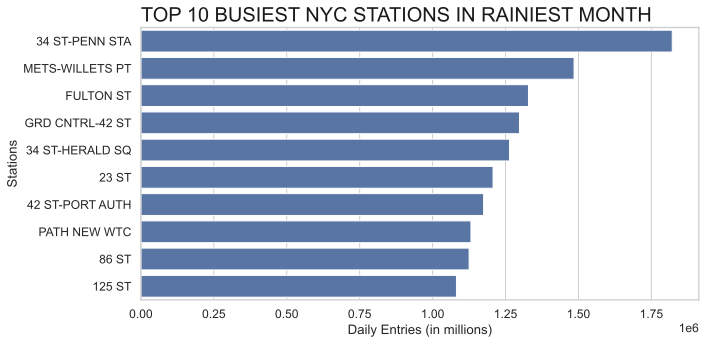

In [80]:
# plt.bar(height=station_totals['DAILY_ENTRIES'][:10], x=station_totals['STATION'][:10])
plt.figure(figsize=(10,5)),
ax = sns.barplot(x=station_totals['DAILY_ENTRIES'][:10], y=station_totals['STATION'][:10], data=station_totals,  color="b")
plt.title('TOP 10 BUSIEST NYC STATIONS IN RAINIEST MONTH', fontsize = 20, color='k', loc='left')
plt.ylabel("Stations");
plt.xlabel('Daily Entries (in millions)')
plt.tight_layout()
plt.savefig("top_10_busiest_stations.png")